In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sn

In [5]:
df=pd.read_csv('NY Realstate Pricing.csv')
df

,F1,id,neighbourhood,latitude,longitude,room_type,price,days_occupied_in_2019,minimum_nights,number_of_reviews,reviews_per_month,availability_2020
0,0,2595,Midtown,40.75362,-73.98377,Entire home/apt,225,15,10,48,0.39,1
1,1,3831,Brooklyn,40.68514,-73.95976,Entire home/apt,89,188,1,295,4.67,1
2,2,5099,Manhattan,40.74767,-73.97500,Entire home/apt,200,362,3,78,0.60,19
3,3,5121,Bedford-Stuyvesant,40.68688,-73.95596,Private room,60,0,29,49,0.38,365
4,4,5178,Manhattan,40.76489,-73.98493,Private room,79,141,2,454,3.52,242
...,...,...,...,...,...,...,...,...,...,...,...,...
17609,28313,23691588,Brooklyn,40.69312,-73.94073,Shared room,32,9,31,5,0.26,1
17610,17415,14712466,Brooklyn,40.65446,-73.92613,Shared room,99,7,100,1,0.03,0
17611,27827,23184420,Lower East Side,40.71172,-73.98864,Shared room,41,14,180,2,0.12,365
17612,29127,24555212,Manhattan,40.71113,-73.98840,Shared room,38,0,180,1,0.27,365


In [6]:
sum(df.duplicated(subset="id"))==1

False

In [7]:
df.drop_duplicates(subset="id",keep='first')

,F1,id,neighbourhood,latitude,longitude,room_type,price,days_occupied_in_2019,minimum_nights,number_of_reviews,reviews_per_month,availability_2020
0,0,2595,Midtown,40.75362,-73.98377,Entire home/apt,225,15,10,48,0.39,1
1,1,3831,Brooklyn,40.68514,-73.95976,Entire home/apt,89,188,1,295,4.67,1
2,2,5099,Manhattan,40.74767,-73.97500,Entire home/apt,200,362,3,78,0.60,19
3,3,5121,Bedford-Stuyvesant,40.68688,-73.95596,Private room,60,0,29,49,0.38,365
4,4,5178,Manhattan,40.76489,-73.98493,Private room,79,141,2,454,3.52,242
...,...,...,...,...,...,...,...,...,...,...,...,...
17609,28313,23691588,Brooklyn,40.69312,-73.94073,Shared room,32,9,31,5,0.26,1
17610,17415,14712466,Brooklyn,40.65446,-73.92613,Shared room,99,7,100,1,0.03,0
17611,27827,23184420,Lower East Side,40.71172,-73.98864,Shared room,41,14,180,2,0.12,365
17612,29127,24555212,Manhattan,40.71113,-73.98840,Shared room,38,0,180,1,0.27,365


In [8]:
df.isnull().sum()

F1                       0
id                       0
neighbourhood            0
latitude                 0
longitude                0
room_type                0
price                    0
days_occupied_in_2019    0
minimum_nights           0
number_of_reviews        0
reviews_per_month        0
availability_2020        0
dtype: int64

In [9]:
df.describe()

,F1,id,latitude,longitude,price,days_occupied_in_2019,minimum_nights,number_of_reviews,reviews_per_month,availability_2020
count,17614.000000,1.761400e+04,17614.000000,17614.000000,17614.000000,17614.000000,17614.000000,17614.000000,17614.000000,17614.000000
mean,18547.564664,1.572032e+07,40.726755,-73.947732,145.455490,179.517656,7.392926,56.128988,1.607060,154.154763
std,11000.717341,9.644155e+06,0.056981,0.050213,194.990677,130.202015,19.233869,65.972370,1.635528,138.079651
min,0.000000,2.595000e+03,40.508680,-74.239860,0.000000,0.000000,1.000000,1.000000,0.010000,0.000000
25%,8192.250000,6.718288e+06,40.686042,-73.980938,70.000000,35.000000,2.000000,9.000000,0.340000,8.000000
50%,19496.500000,1.654699e+07,40.720540,-73.953050,109.000000,198.000000,3.000000,33.000000,1.060000,125.000000
75%,28686.750000,2.407707e+07,40.763127,-73.930682,170.000000,301.000000,5.000000,79.000000,2.460000,309.000000
max,35596.000000,3.056528e+07,40.908040,-73.721790,9999.000000,364.000000,1125.000000,675.000000,19.250000,365.000000


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17614 entries, 0 to 17613
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   F1                     17614 non-null  int64  
 1   id                     17614 non-null  int64  
 2   neighbourhood          17614 non-null  object 
 3   latitude               17614 non-null  float64
 4   longitude              17614 non-null  float64
 5   room_type              17614 non-null  object 
 6   price                  17614 non-null  int64  
 7   days_occupied_in_2019  17614 non-null  int64  
 8   minimum_nights         17614 non-null  int64  
 9   number_of_reviews      17614 non-null  int64  
 10  reviews_per_month      17614 non-null  float64
 11  availability_2020      17614 non-null  int64  
dtypes: float64(3), int64(7), object(2)
memory usage: 1.6+ MB


In [11]:
a=df[["neighbourhood"]].values
a

array([['Midtown'],
       ['Brooklyn'],
       ['Manhattan'],
       ...,
       ['Lower East Side'],
       ['Manhattan'],
       ['Manhattan']], dtype=object)

In [12]:
df1=df.drop(['F1'],axis=1)
df1

,id,neighbourhood,latitude,longitude,room_type,price,days_occupied_in_2019,minimum_nights,number_of_reviews,reviews_per_month,availability_2020
0,2595,Midtown,40.75362,-73.98377,Entire home/apt,225,15,10,48,0.39,1
1,3831,Brooklyn,40.68514,-73.95976,Entire home/apt,89,188,1,295,4.67,1
2,5099,Manhattan,40.74767,-73.97500,Entire home/apt,200,362,3,78,0.60,19
3,5121,Bedford-Stuyvesant,40.68688,-73.95596,Private room,60,0,29,49,0.38,365
4,5178,Manhattan,40.76489,-73.98493,Private room,79,141,2,454,3.52,242
...,...,...,...,...,...,...,...,...,...,...,...
17609,23691588,Brooklyn,40.69312,-73.94073,Shared room,32,9,31,5,0.26,1
17610,14712466,Brooklyn,40.65446,-73.92613,Shared room,99,7,100,1,0.03,0
17611,23184420,Lower East Side,40.71172,-73.98864,Shared room,41,14,180,2,0.12,365
17612,24555212,Manhattan,40.71113,-73.98840,Shared room,38,0,180,1,0.27,365


In [13]:
#adding dummies variable to qualitative datatype
countaryside=pd.get_dummies(df1['neighbourhood'],drop_first=True)
df1=pd.concat([df1,countaryside],axis=1)
df1

,id,neighbourhood,latitude,longitude,room_type,price,days_occupied_in_2019,minimum_nights,number_of_reviews,reviews_per_month,...,West Village,Westchester Village,Westerleigh,Whitestone,Williamsbridge,Williamsburg,Windsor Terrace,Woodhaven,Woodlawn,Woodside
0,2595,Midtown,40.75362,-73.98377,Entire home/apt,225,15,10,48,0.39,...,0,0,0,0,0,0,0,0,0,0
1,3831,Brooklyn,40.68514,-73.95976,Entire home/apt,89,188,1,295,4.67,...,0,0,0,0,0,0,0,0,0,0
2,5099,Manhattan,40.74767,-73.97500,Entire home/apt,200,362,3,78,0.60,...,0,0,0,0,0,0,0,0,0,0
3,5121,Bedford-Stuyvesant,40.68688,-73.95596,Private room,60,0,29,49,0.38,...,0,0,0,0,0,0,0,0,0,0
4,5178,Manhattan,40.76489,-73.98493,Private room,79,141,2,454,3.52,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17609,23691588,Brooklyn,40.69312,-73.94073,Shared room,32,9,31,5,0.26,...,0,0,0,0,0,0,0,0,0,0
17610,14712466,Brooklyn,40.65446,-73.92613,Shared room,99,7,100,1,0.03,...,0,0,0,0,0,0,0,0,0,0
17611,23184420,Lower East Side,40.71172,-73.98864,Shared room,41,14,180,2,0.12,...,0,0,0,0,0,0,0,0,0,0
17612,24555212,Manhattan,40.71113,-73.98840,Shared room,38,0,180,1,0.27,...,0,0,0,0,0,0,0,0,0,0


In [14]:
df1.drop(['neighbourhood'],axis=1,inplace=True)

In [15]:
df1

,id,latitude,longitude,room_type,price,days_occupied_in_2019,minimum_nights,number_of_reviews,reviews_per_month,availability_2020,...,West Village,Westchester Village,Westerleigh,Whitestone,Williamsbridge,Williamsburg,Windsor Terrace,Woodhaven,Woodlawn,Woodside
0,2595,40.75362,-73.98377,Entire home/apt,225,15,10,48,0.39,1,...,0,0,0,0,0,0,0,0,0,0
1,3831,40.68514,-73.95976,Entire home/apt,89,188,1,295,4.67,1,...,0,0,0,0,0,0,0,0,0,0
2,5099,40.74767,-73.97500,Entire home/apt,200,362,3,78,0.60,19,...,0,0,0,0,0,0,0,0,0,0
3,5121,40.68688,-73.95596,Private room,60,0,29,49,0.38,365,...,0,0,0,0,0,0,0,0,0,0
4,5178,40.76489,-73.98493,Private room,79,141,2,454,3.52,242,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17609,23691588,40.69312,-73.94073,Shared room,32,9,31,5,0.26,1,...,0,0,0,0,0,0,0,0,0,0
17610,14712466,40.65446,-73.92613,Shared room,99,7,100,1,0.03,0,...,0,0,0,0,0,0,0,0,0,0
17611,23184420,40.71172,-73.98864,Shared room,41,14,180,2,0.12,365,...,0,0,0,0,0,0,0,0,0,0
17612,24555212,40.71113,-73.98840,Shared room,38,0,180,1,0.27,365,...,0,0,0,0,0,0,0,0,0,0


In [16]:
room=pd.get_dummies(df1['room_type'],drop_first=True)
df1=pd.concat([df1,room],axis=1)
df1

,id,latitude,longitude,room_type,price,days_occupied_in_2019,minimum_nights,number_of_reviews,reviews_per_month,availability_2020,...,Whitestone,Williamsbridge,Williamsburg,Windsor Terrace,Woodhaven,Woodlawn,Woodside,Hotel room,Private room,Shared room
0,2595,40.75362,-73.98377,Entire home/apt,225,15,10,48,0.39,1,...,0,0,0,0,0,0,0,0,0,0
1,3831,40.68514,-73.95976,Entire home/apt,89,188,1,295,4.67,1,...,0,0,0,0,0,0,0,0,0,0
2,5099,40.74767,-73.97500,Entire home/apt,200,362,3,78,0.60,19,...,0,0,0,0,0,0,0,0,0,0
3,5121,40.68688,-73.95596,Private room,60,0,29,49,0.38,365,...,0,0,0,0,0,0,0,0,1,0
4,5178,40.76489,-73.98493,Private room,79,141,2,454,3.52,242,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17609,23691588,40.69312,-73.94073,Shared room,32,9,31,5,0.26,1,...,0,0,0,0,0,0,0,0,0,1
17610,14712466,40.65446,-73.92613,Shared room,99,7,100,1,0.03,0,...,0,0,0,0,0,0,0,0,0,1
17611,23184420,40.71172,-73.98864,Shared room,41,14,180,2,0.12,365,...,0,0,0,0,0,0,0,0,0,1
17612,24555212,40.71113,-73.98840,Shared room,38,0,180,1,0.27,365,...,0,0,0,0,0,0,0,0,0,1


In [17]:
df1.drop(['room_type'],axis=1,inplace=True)
df1

,id,latitude,longitude,price,days_occupied_in_2019,minimum_nights,number_of_reviews,reviews_per_month,availability_2020,Alphabet City,...,Whitestone,Williamsbridge,Williamsburg,Windsor Terrace,Woodhaven,Woodlawn,Woodside,Hotel room,Private room,Shared room
0,2595,40.75362,-73.98377,225,15,10,48,0.39,1,0,...,0,0,0,0,0,0,0,0,0,0
1,3831,40.68514,-73.95976,89,188,1,295,4.67,1,0,...,0,0,0,0,0,0,0,0,0,0
2,5099,40.74767,-73.97500,200,362,3,78,0.60,19,0,...,0,0,0,0,0,0,0,0,0,0
3,5121,40.68688,-73.95596,60,0,29,49,0.38,365,0,...,0,0,0,0,0,0,0,0,1,0
4,5178,40.76489,-73.98493,79,141,2,454,3.52,242,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17609,23691588,40.69312,-73.94073,32,9,31,5,0.26,1,0,...,0,0,0,0,0,0,0,0,0,1
17610,14712466,40.65446,-73.92613,99,7,100,1,0.03,0,0,...,0,0,0,0,0,0,0,0,0,1
17611,23184420,40.71172,-73.98864,41,14,180,2,0.12,365,0,...,0,0,0,0,0,0,0,0,0,1
17612,24555212,40.71113,-73.98840,38,0,180,1,0.27,365,0,...,0,0,0,0,0,0,0,0,0,1


In [18]:
#seperation of train and test dataset
from sklearn.model_selection import train_test_split

np.random.seed(0)
df_train,df_test=train_test_split(df1,test_size=0.3,random_state=100)
df_train

,id,latitude,longitude,price,days_occupied_in_2019,minimum_nights,number_of_reviews,reviews_per_month,availability_2020,Alphabet City,...,Whitestone,Williamsbridge,Williamsburg,Windsor Terrace,Woodhaven,Woodlawn,Woodside,Hotel room,Private room,Shared room
1096,7728553,40.67793,-73.99531,150,13,1,92,2.29,363,0,...,0,0,0,0,0,0,0,0,0,0
1838,29144832,40.75138,-73.98143,300,334,1,10,0.73,0,0,...,0,0,0,0,0,0,0,0,0,0
15533,20437233,40.83556,-73.91098,70,302,4,48,1.73,52,0,...,0,0,0,0,0,0,0,0,1,0
1662,10784650,40.72760,-73.98635,219,82,1,112,2.43,322,0,...,0,0,0,0,0,0,0,0,0,0
6132,18652220,40.71370,-73.95711,325,350,3,37,1.21,2,0,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16304,3265407,40.67303,-73.96424,57,363,7,12,0.18,0,0,...,0,0,0,0,0,0,0,0,1,0
79,22911,40.68413,-73.92357,125,115,7,139,1.18,230,0,...,0,0,0,0,0,0,0,0,0,0
12119,29103275,40.77345,-73.95386,100,25,1,112,8.64,347,0,...,0,0,0,0,0,0,0,0,1,0
14147,21026558,40.78628,-73.97482,250,223,2,7,0.35,157,0,...,0,0,0,0,0,0,0,0,1,0


In [19]:
#preprocessing of train data
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()
arr=['id','latitude','longitude','price','days_occupied_in_2019','minimum_nights','number_of_reviews','reviews_per_month','availability_2020']
df_train[arr]=scaler.fit_transform(df_train[arr])

In [20]:
df_train

,id,latitude,longitude,price,days_occupied_in_2019,minimum_nights,number_of_reviews,reviews_per_month,availability_2020,Alphabet City,...,Whitestone,Williamsbridge,Williamsburg,Windsor Terrace,Woodhaven,Woodlawn,Woodside,Hotel room,Private room,Shared room
1096,0.252791,0.423803,0.472040,0.015002,0.035714,0.000000,0.142857,0.118503,0.994521,0,...,0,0,0,0,0,0,0,0,0,0
1838,0.953523,0.607722,0.498832,0.030003,0.917582,0.000000,0.014129,0.037422,0.000000,0,...,0,0,0,0,0,0,0,0,0,0
15533,0.668614,0.818510,0.634818,0.007001,0.829670,0.002669,0.073783,0.089397,0.142466,0,...,0,0,0,0,0,0,0,0,1,0
1662,0.352785,0.548177,0.489335,0.021902,0.225275,0.000000,0.174254,0.125780,0.882192,0,...,0,0,0,0,0,0,0,0,0,0
6132,0.610209,0.513371,0.545776,0.032503,0.961538,0.001779,0.056515,0.062370,0.005479,0,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16304,0.106758,0.411533,0.532013,0.005701,0.997253,0.005338,0.017268,0.008836,0.000000,0,...,0,0,0,0,0,0,0,0,1,0
79,0.000665,0.439328,0.610516,0.012501,0.315934,0.005338,0.216641,0.060811,0.630137,0,...,0,0,0,0,0,0,0,0,0,0
12119,0.952164,0.662986,0.552049,0.010001,0.068681,0.000000,0.174254,0.448545,0.950685,0,...,0,0,0,0,0,0,0,0,1,0
14147,0.687896,0.695112,0.511591,0.025003,0.612637,0.000890,0.009419,0.017672,0.430137,0,...,0,0,0,0,0,0,0,0,1,0


In [25]:
y_train=df_train.pop('price')
x_train=df_train
x_train

,id,latitude,longitude,days_occupied_in_2019,minimum_nights,number_of_reviews,reviews_per_month,availability_2020,Alphabet City,Annadale,...,Whitestone,Williamsbridge,Williamsburg,Windsor Terrace,Woodhaven,Woodlawn,Woodside,Hotel room,Private room,Shared room
1096,0.252791,0.423803,0.472040,0.035714,0.000000,0.142857,0.118503,0.994521,0,0,...,0,0,0,0,0,0,0,0,0,0
1838,0.953523,0.607722,0.498832,0.917582,0.000000,0.014129,0.037422,0.000000,0,0,...,0,0,0,0,0,0,0,0,0,0
15533,0.668614,0.818510,0.634818,0.829670,0.002669,0.073783,0.089397,0.142466,0,0,...,0,0,0,0,0,0,0,0,1,0
1662,0.352785,0.548177,0.489335,0.225275,0.000000,0.174254,0.125780,0.882192,0,0,...,0,0,0,0,0,0,0,0,0,0
6132,0.610209,0.513371,0.545776,0.961538,0.001779,0.056515,0.062370,0.005479,0,0,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16304,0.106758,0.411533,0.532013,0.997253,0.005338,0.017268,0.008836,0.000000,0,0,...,0,0,0,0,0,0,0,0,1,0
79,0.000665,0.439328,0.610516,0.315934,0.005338,0.216641,0.060811,0.630137,0,0,...,0,0,0,0,0,0,0,0,0,0
12119,0.952164,0.662986,0.552049,0.068681,0.000000,0.174254,0.448545,0.950685,0,0,...,0,0,0,0,0,0,0,0,1,0
14147,0.687896,0.695112,0.511591,0.612637,0.000890,0.009419,0.017672,0.430137,0,0,...,0,0,0,0,0,0,0,0,1,0


In [27]:
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
model=LinearRegression()
model.fit(x_train,y_train)
rfe=RFE(model,n_features_to_select=10)
rfe=rfe.fit(x_train,y_train)
list(zip(x_train.columns,rfe.support_,rfe.ranking_))

[('id', False, 181),
 ('latitude', False, 114),
 ('longitude', True, 1),
 ('days_occupied_in_2019', False, 79),
 ('minimum_nights', False, 42),
 ('number_of_reviews', False, 72),
 ('reviews_per_month', False, 5),
 ('availability_2020', False, 174),
 ('Alphabet City', False, 133),
 ('Annadale', False, 30),
 ('Astoria', False, 152),
 ('Bath Beach', False, 48),
 ('Battery Park City', False, 35),
 ('Bay Ridge', False, 45),
 ('Baychester', False, 88),
 ('Bayside', False, 28),
 ('Bedford Park', False, 118),
 ('Bedford-Stuyvesant', False, 161),
 ('Bensonhurst', False, 34),
 ('Bergen Beach', False, 37),
 ('Boerum Hill', False, 180),
 ('Borough Park', False, 44),
 ('Brighton Beach', False, 77),
 ('Bronxdale', False, 129),
 ('Brooklyn', False, 171),
 ('Brooklyn Heights', True, 1),
 ('Brooklyn Navy Yard', False, 182),
 ('Brownsville', False, 50),
 ('Bushwick', False, 168),
 ('Canarsie', False, 157),
 ('Carroll Gardens', False, 141),
 ('Castle Hill', False, 167),
 ('Chelsea', False, 91),
 ('Chinat

In [29]:
col=x_train.columns[rfe.support_]
col

Index(['longitude', 'Brooklyn Heights', 'Concord', 'Elm Park', 'Eltingville',
       'Grasmere', 'New Springville', 'Port Richmond', 'Randall Manor',
       'Sea Gate'],
      dtype='object')

In [30]:
x_train_rfe=x_train[col]
x_train_rfe

,longitude,Brooklyn Heights,Concord,Elm Park,Eltingville,Grasmere,New Springville,Port Richmond,Randall Manor,Sea Gate
1096,0.472040,0,0,0,0,0,0,0,0,0
1838,0.498832,0,0,0,0,0,0,0,0,0
15533,0.634818,0,0,0,0,0,0,0,0,0
1662,0.489335,0,0,0,0,0,0,0,0,0
6132,0.545776,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
16304,0.532013,0,0,0,0,0,0,0,0,0
79,0.610516,0,0,0,0,0,0,0,0,0
12119,0.552049,0,0,0,0,0,0,0,0,0
14147,0.511591,0,0,0,0,0,0,0,0,0


In [33]:
import statsmodels.api as sm
x_train_rfe=sm.add_constant(x_train_rfe)
x_train_rfe

,const,longitude,Brooklyn Heights,Concord,Elm Park,Eltingville,Grasmere,New Springville,Port Richmond,Randall Manor,Sea Gate
1096,1.0,0.472040,0,0,0,0,0,0,0,0,0
1838,1.0,0.498832,0,0,0,0,0,0,0,0,0
15533,1.0,0.634818,0,0,0,0,0,0,0,0,0
1662,1.0,0.489335,0,0,0,0,0,0,0,0,0
6132,1.0,0.545776,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
16304,1.0,0.532013,0,0,0,0,0,0,0,0,0
79,1.0,0.610516,0,0,0,0,0,0,0,0,0
12119,1.0,0.552049,0,0,0,0,0,0,0,0,0
14147,1.0,0.511591,0,0,0,0,0,0,0,0,0


In [35]:
model=sm.OLS(y_train,x_train_rfe).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.032
Model:                            OLS   Adj. R-squared:                  0.031
Method:                 Least Squares   F-statistic:                     40.38
Date:                Wed, 26 Apr 2023   Prob (F-statistic):           3.23e-79
Time:                        21:52:57   Log-Likelihood:                 31189.
No. Observations:               12329   AIC:                        -6.236e+04
Df Residuals:                   12318   BIC:                        -6.228e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const                0.0329      0.001  

In [36]:
x_train_new1=x_train_rfe.drop(['Randall Manor'],axis=1)
x_train_new1

,const,longitude,Brooklyn Heights,Concord,Elm Park,Eltingville,Grasmere,New Springville,Port Richmond,Sea Gate
1096,1.0,0.472040,0,0,0,0,0,0,0,0
1838,1.0,0.498832,0,0,0,0,0,0,0,0
15533,1.0,0.634818,0,0,0,0,0,0,0,0
1662,1.0,0.489335,0,0,0,0,0,0,0,0
6132,1.0,0.545776,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
16304,1.0,0.532013,0,0,0,0,0,0,0,0
79,1.0,0.610516,0,0,0,0,0,0,0,0
12119,1.0,0.552049,0,0,0,0,0,0,0,0
14147,1.0,0.511591,0,0,0,0,0,0,0,0


In [38]:
import statsmodels.api as sm
x_train_new1=sm.add_constant(x_train_new1)
model=sm.OLS(y_train,x_train_new1).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.032
Model:                            OLS   Adj. R-squared:                  0.031
Method:                 Least Squares   F-statistic:                     44.76
Date:                Wed, 26 Apr 2023   Prob (F-statistic):           7.53e-80
Time:                        22:03:47   Log-Likelihood:                 31189.
No. Observations:               12329   AIC:                        -6.236e+04
Df Residuals:                   12319   BIC:                        -6.228e+04
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const                0.0329      0.001  

In [40]:
x_train_new2=x_train_new1.drop(['Concord','Elm Park','Eltingville','Grasmere','New Springville','Port Richmond'],axis=1)
x_train_new2

,const,longitude,Brooklyn Heights,Sea Gate
1096,1.0,0.472040,0,0
1838,1.0,0.498832,0,0
15533,1.0,0.634818,0,0
1662,1.0,0.489335,0,0
6132,1.0,0.545776,0,0
...,...,...,...,...
16304,1.0,0.532013,0,0
79,1.0,0.610516,0,0
12119,1.0,0.552049,0,0
14147,1.0,0.511591,0,0


In [43]:
import statsmodels.api as sm
x_train_model=sm.add_constant(x_train_new2)
 #x_train_model
model=sm.OLS(y_train,x_train_model).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.031
Model:                            OLS   Adj. R-squared:                  0.030
Method:                 Least Squares   F-statistic:                     129.6
Date:                Wed, 26 Apr 2023   Prob (F-statistic):           1.25e-82
Time:                        22:10:11   Log-Likelihood:                 31182.
No. Observations:               12329   AIC:                        -6.236e+04
Df Residuals:                   12325   BIC:                        -6.233e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const                0.0324      0.001  

In [45]:
y_train_price=model.predict(x_train_model)
y_train_price


1096     0.017404
1838     0.016550
15533    0.012219
1662     0.016853
6132     0.015055
           ...   
16304    0.015493
79       0.012993
12119    0.014855
14147    0.016144
5640     0.016886
Length: 12329, dtype: float64

In [47]:
from sklearn.metrics import r2_score
r2_score(y_train,y_train_price)

0.03057068259108442

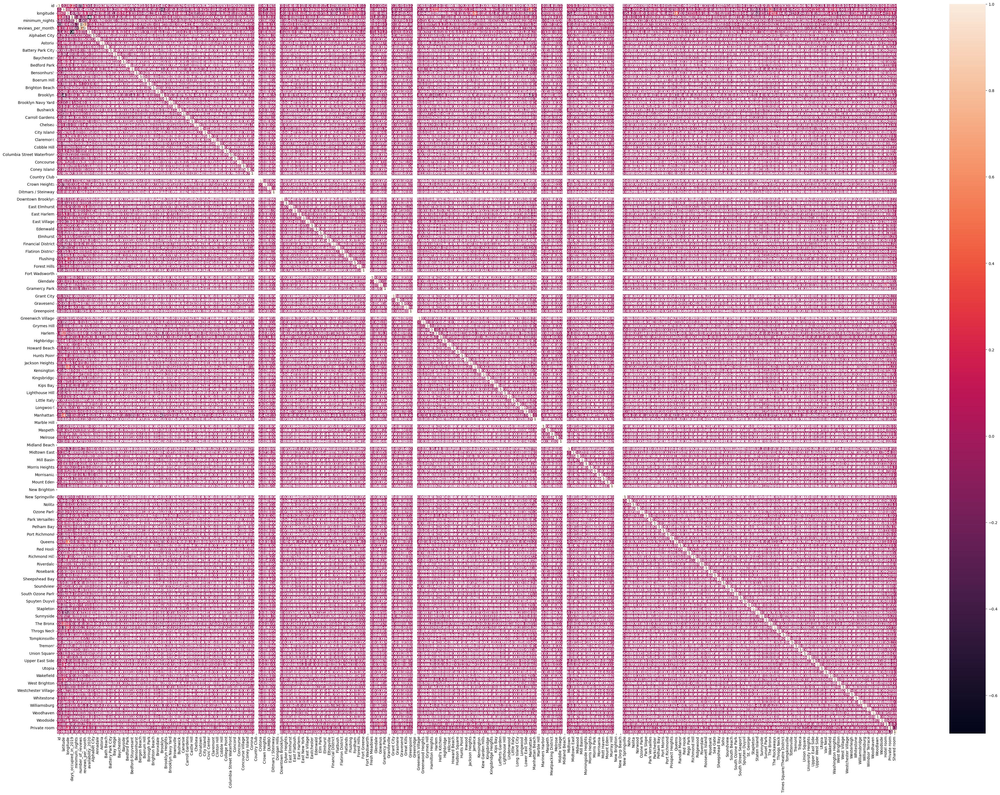

In [51]:
plt.figure(figsize=(50,35))
sn.heatmap(df_train.corr(),annot=True)
plt.show()
